# Consensus time

#### Working directory should contain root atlas Seurat object, which is available on GEO under record GSE152766:

    Root_Atlas.rds (or get it by running through notebook 2, 3, 4, 5, 6, 7 & 8)

#### Working directory must contain subdirectories,supp_data

#### supp_data/ should contain the file:

    Ground_Tissue_Atlas.rds (get it by running through notebook 7)
    Ground_Tissue_Atlas_latent_time.txt (get it by running through notebook 8)
    Epidermis_LRC_Atlas.rds (get it by running through notebook 7)
    Epidermis_LRC_Atlas_latent_time.txt (get it by running through notebook 8, need to change tissue/lineage)
    Columella_Atlas.rds (get it by running through notebook 7)
    Columella_Atlas_latent_time.rds (get it by running through notebook 8,  need to change tissue/lineage)
    Stele_Atlas.rds (get it by running through notebook 7)
    Stele_Atlas_latent_time.rds (get it by running through notebook 8,  need to change tissue/lineage)

In [1]:
rm(list=ls())
# Set the working directory to where folders named after the samples are located. 
# The folder contains spliced.mtx, unspliced.mtx, barcodes and gene id files, and json files produced by scKB that documents the sequencing stats. 
setwd("/scratch/AG_Ohler/CheWei/scKB")

In [2]:
# Load libraries
suppressMessages(library(Seurat))
suppressMessages(library(CytoTRACE))
suppressMessages(library(RColorBrewer))
suppressMessages(library(ggplot2))
suppressMessages(library(grid))

In [3]:
sessionInfo()

R version 3.6.1 (2019-07-05)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /fast/home/c/chsu/anaconda3/envs/seu314/lib/libopenblasp-r0.3.9.so

locale:
 [1] LC_CTYPE=en_US.utf-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.utf-8        LC_COLLATE=en_US.utf-8    
 [5] LC_MONETARY=en_US.utf-8    LC_MESSAGES=en_US.utf-8   
 [7] LC_PAPER=en_US.utf-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.utf-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
[1] ggplot2_3.3.1      RColorBrewer_1.1-2 CytoTRACE_0.1.0    Seurat_3.1.5      

loaded via a namespace (and not attached):
 [1] httr_1.4.1         tidyr_1.1.0        jsonlite_1.6.1     viridisLite_0.3.0 
 [5] splines_3.6.1      leiden_0.3.3       ggrepel_0.8.2      globals_0.12

In [4]:
# Plotting function for time 
plot_time <- function(rc.integrated){
p1 <- FeaturePlot(end.cor.integrated, features = "CytoTRACE", pt.size=0.5)+ scale_colour_gradientn(colours = rev(brewer.pal(11,"Spectral")))
p2 <- FeaturePlot(end.cor.integrated, features = "latenttime", pt.size=0.5)+ scale_colour_gradientn(colours = brewer.pal(11,"Spectral"))+ggtitle("Latent Time")
p3 <- FeaturePlot(end.cor.integrated, features = "consensus.time", pt.size=0.5)+ scale_colour_gradientn(colours = brewer.pal(11,"Spectral"))+ggtitle("Consensus Time")
options(repr.plot.width=16, repr.plot.height=16)
gl <- lapply(list(p1, p2, p3), ggplotGrob)
gwidth <- do.call(unit.pmax, lapply(gl, "[[", "widths"))
gl <- lapply(gl, "[[<-", "widths", value = gwidth)
gridExtra::grid.arrange(grobs=gl, ncol=2)
}

In [7]:
# Read in atlas
rc.integrated <- readRDS('./Root_Atlas.rds')

## 1. Ground Tissue

In [10]:
# Read in ground tissue atlas
end.cor.integrated <- readRDS('./supp_data/Ground_Tissue_Atlas.rds')

In [11]:
# Function for normalizing values to range 0 to 1
range01 <- function(x) {
        (x - min(x))/(max(x) - min(x))
}

In [12]:
# Read in latent time
latent.time <- as.numeric(read.table("./supp_data/Ground_Tissue_Atlas_latent_time.txt", header=F)$V1)
end.cor.integrated$latenttime <- latent.time

In [10]:
# Calculate and store consensus time
consensus.time <- range01((-(end.cor.integrated$CytoTRACE-1)+end.cor.integrated$latenttime)/2)
end.cor.integrated$consensus.time <- consensus.time

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



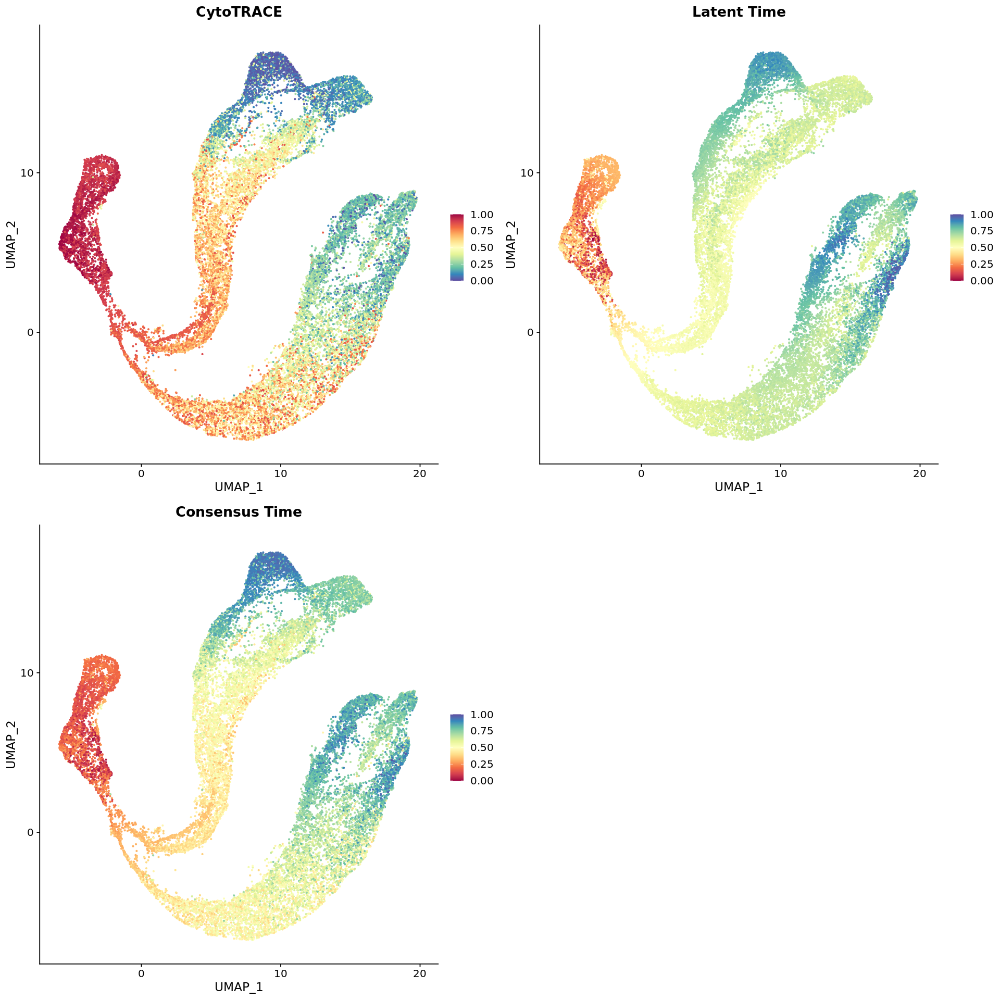

In [13]:
plot_time(end.cor.integrated)

In [14]:
# Correlation among CytoTRACE, latent time and consensus time
res <- cor(data.frame(CytoTRACE=end.cor.integrated$CytoTRACE,latent.time=end.cor.integrated$latenttime,consensus.time=end.cor.integrated$consensus.time))
round(res, 2)

,CytoTRACE,latent.time,consensus.time
CytoTRACE,1.00,-0.77,-0.97
latent.time,-0.77,1.00,0.91
consensus.time,-0.97,0.91,1.00


In [21]:
# Save Seurat object
saveRDS(end.cor.integrated,'./supp_data/Ground_Tissue_Atlas.rds')

## 2. Epidermis + LRC

In [18]:
end.cor.integrated <- readRDS('./supp_data/Epidermis_LRC_Atlas.rds')

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



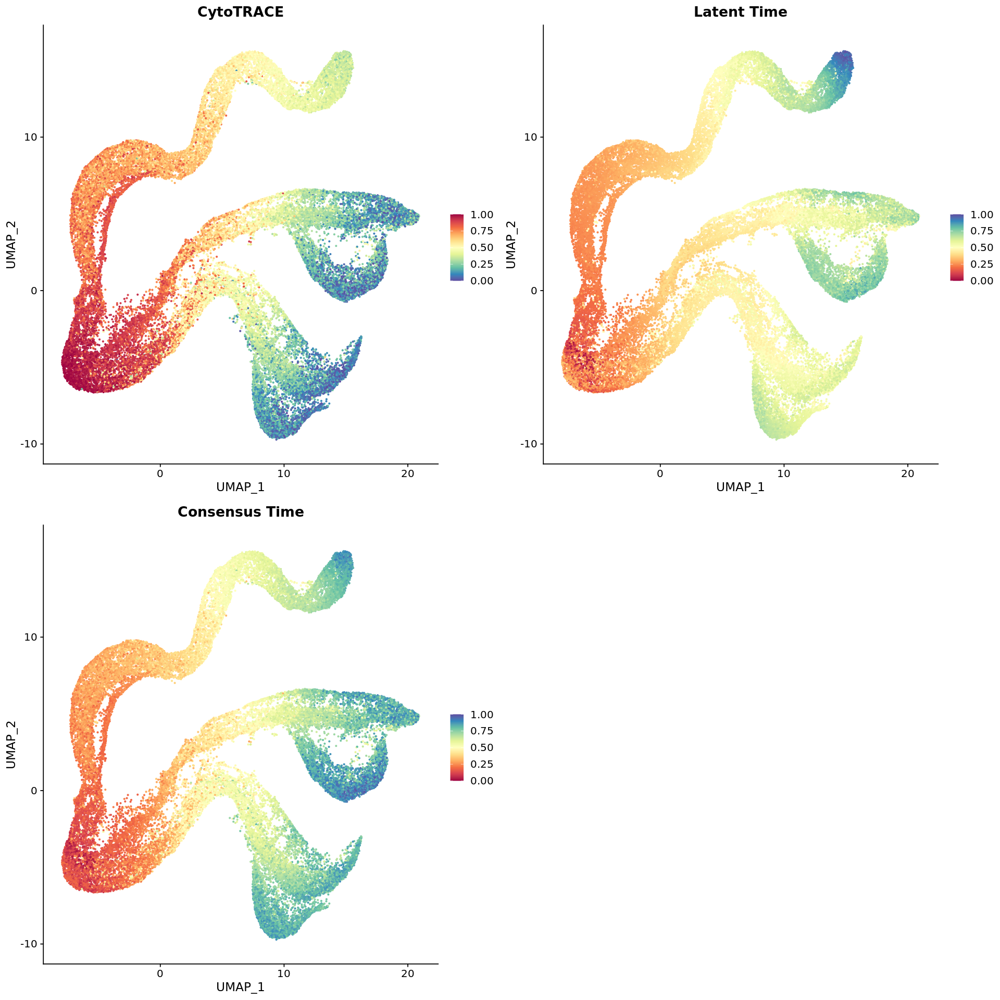

In [19]:
latent.time <- as.numeric(read.table("./supp_data/Epidermis_LRC_Atlas_latent_time.txt", header=F)$V1)
end.cor.integrated$latenttime <- latent.time

consensus.time <- range01((-(end.cor.integrated$CytoTRACE-1)+end.cor.integrated$latenttime)/2)
end.cor.integrated$consensus.time <- consensus.time

plot_time(end.cor.integrated)

In [20]:
res <- cor(data.frame(CytoTRACE=end.cor.integrated$CytoTRACE,latent.time=end.cor.integrated$latenttime,consensus.time=end.cor.integrated$consensus.time))
round(res, 2)

,CytoTRACE,latent.time,consensus.time
CytoTRACE,1.00,-0.81,-0.97
latent.time,-0.81,1.00,0.93
consensus.time,-0.97,0.93,1.00


In [12]:
saveRDS(end.cor.integrated,'./supp_data/Epidermis_LRC_Atlas.rds')

## 3. Columella

In [22]:
end.cor.integrated <- readRDS('./supp_data/Columella_Atlas.rds')

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



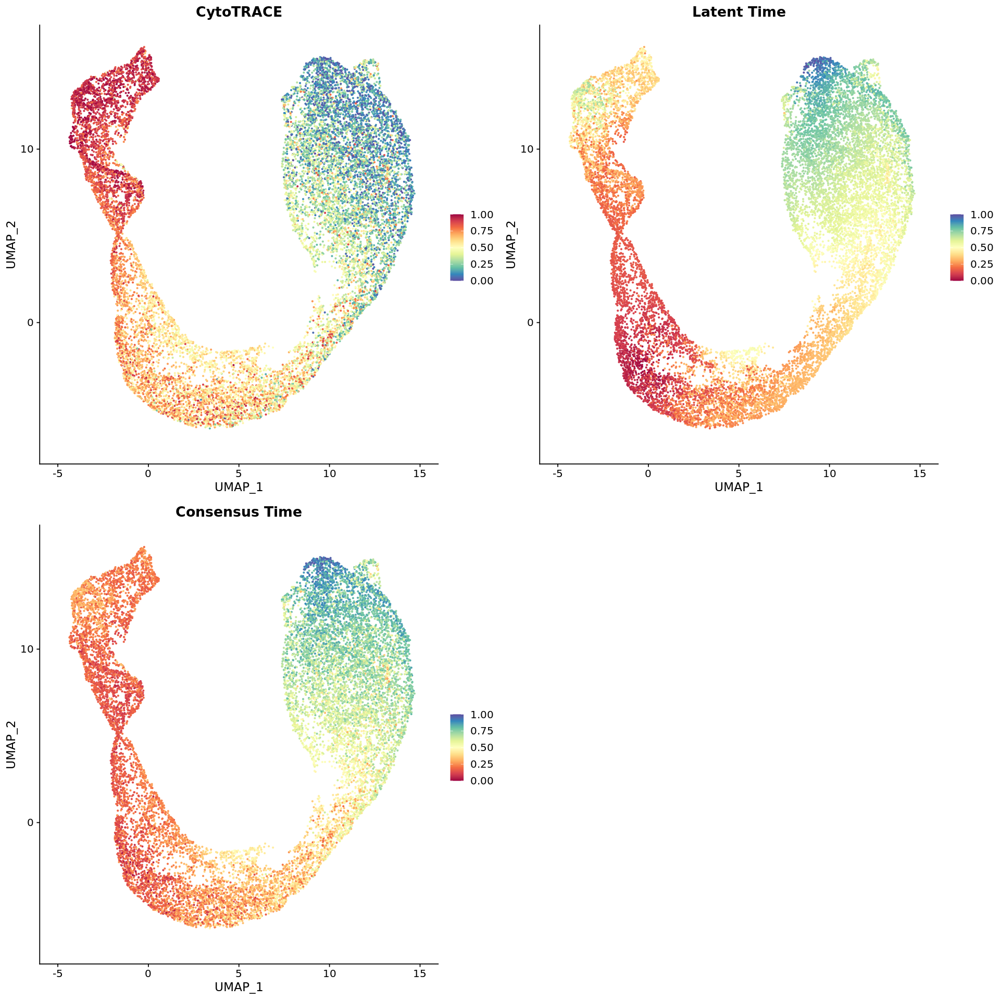

In [24]:
latent.time <- as.numeric(read.table("./supp_data/Columella_Atlas_latent_time", header=F)$V1)
end.cor.integrated$latenttime <- latent.time

consensus.time <- range01((-(end.cor.integrated$CytoTRACE-1)+end.cor.integrated$latenttime)/2)
end.cor.integrated$consensus.time <- consensus.time

plot_time(end.cor.integrated)

In [25]:
res <- cor(data.frame(CytoTRACE=end.cor.integrated$CytoTRACE,latent.time=end.cor.integrated$latenttime,consensus.time=end.cor.integrated$consensus.time))
round(res, 2)

,CytoTRACE,latent.time,consensus.time
CytoTRACE,1.00,-0.62,-0.92
latent.time,-0.62,1.00,0.88
consensus.time,-0.92,0.88,1.00


In [33]:
saveRDS(end.cor.integrated,'./supp_data/Columella_Atlas.rds')

## 4. Stele

In [26]:
end.cor.integrated <- readRDS('./supp_data/Stele_Atlas.rds')

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



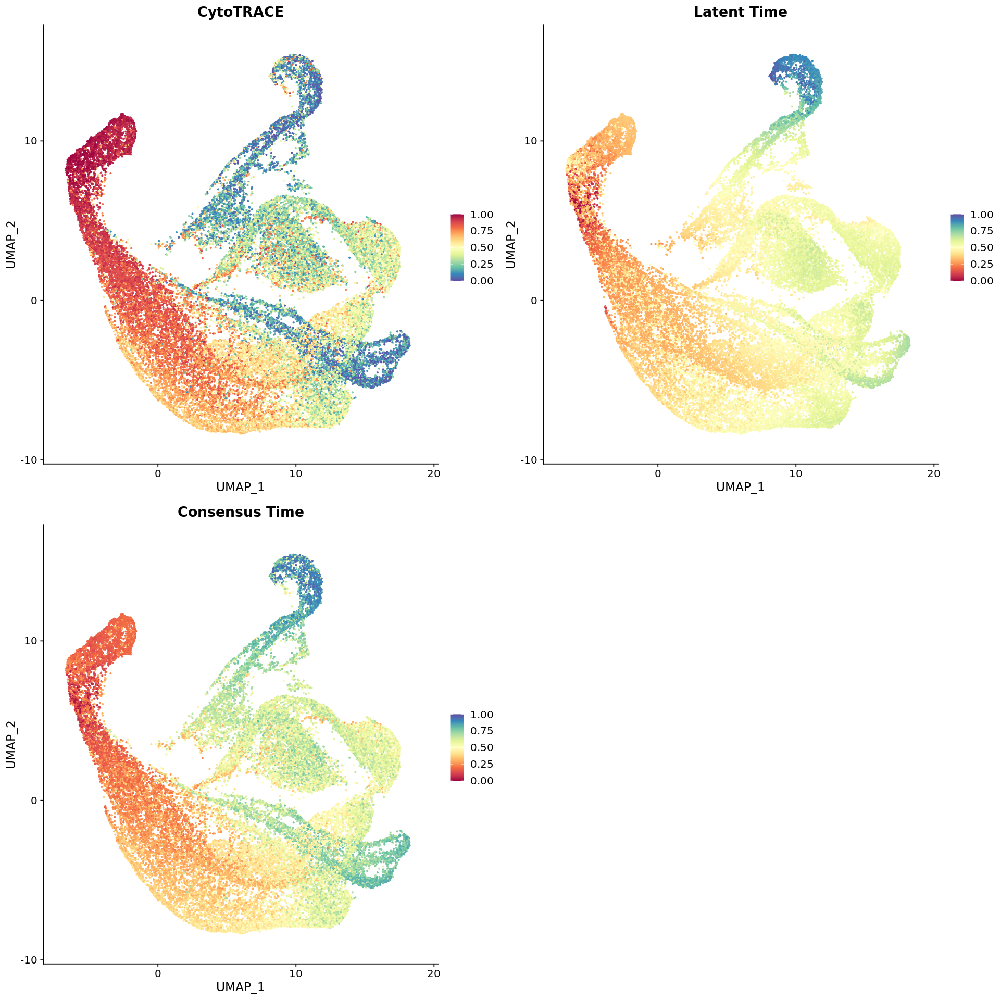

In [27]:
latent.time <- as.numeric(read.table("./supp_data/Stele_Atlas_latent_time.txt", header=F)$V1)
end.cor.integrated$latenttime <- latent.time
end.cor.integrated$CytoTRACE[which(is.na(end.cor.integrated$CytoTRACE))] <- end.cor.integrated$latenttime[which(is.na(end.cor.integrated$CytoTRACE))]

consensus.time <- range01((-(end.cor.integrated$CytoTRACE-1)+end.cor.integrated$latenttime)/2)
end.cor.integrated$consensus.time <- consensus.time

plot_time(end.cor.integrated)

In [28]:
res <- cor(data.frame(CytoTRACE=end.cor.integrated$CytoTRACE,latent.time=end.cor.integrated$latenttime,consensus.time=end.cor.integrated$consensus.time))
round(res, 2)

,CytoTRACE,latent.time,consensus.time
CytoTRACE,1.00,-0.69,-0.96
latent.time,-0.69,1.00,0.85
consensus.time,-0.96,0.85,1.00


In [38]:
saveRDS(end.cor.integrated,'./supp_data/Stele_Atlas.rds')

## 5. Integrate consensus time

In [8]:
# Load 4 tissue/lineages
end.cor.integrated <- readRDS('./supp_data/Ground_Tissue_Atlas.rds')
epi.integrated <- readRDS('./supp_data/Epidermis_LRC_Atlas.rds')
col.integrated <- readRDS('./supp_data/Columella_Atlas.rds')
stl.integrated <- readRDS('./supp_data/Stele_Atlas.rds')

In [9]:
# Cell index for each tissue/lineages
end.cor.traj.idx <- which(rc.integrated$celltype.anno == "Endodermis" | rc.integrated$celltype.anno == "Cortex" | rc.integrated$celltype.anno == "Putative Quiescent Center"| rc.integrated$celltype.anno == "Stem Cell Niche")
epi.traj.idx <- which(rc.integrated$celltype.anno == "Atrichoblast" | rc.integrated$celltype.anno == "Trichoblast" | rc.integrated$celltype.anno == "Lateral Root Cap" | rc.integrated$celltype.anno == "Putative Quiescent Center"| rc.integrated$celltype.anno == "Stem Cell Niche")
col.traj.idx <- which(rc.integrated$celltype.anno == "Columella" | rc.integrated$celltype.anno == "Putative Quiescent Center"| rc.integrated$celltype.anno == "Stem Cell Niche")
stl.traj.idx <- which(rc.integrated$celltype.anno == "Pericycle" | rc.integrated$celltype.anno == "Phloem" | rc.integrated$celltype.anno == "Xylem" | rc.integrated$celltype.anno == "Procambium" | rc.integrated$celltype.anno == "Putative Quiescent Center"| rc.integrated$celltype.anno == "Stem Cell Niche")
scn.traj.idx <- which(rc.integrated$celltype.anno == "Putative Quiescent Center"| rc.integrated$celltype.anno == "Stem Cell Niche")

In [48]:
# Combine consensus time
t1 <- rep(0,ncol(rc.integrated))
t2 <- rep(0,ncol(rc.integrated))
t3 <- rep(0,ncol(rc.integrated))
t4 <- rep(0,ncol(rc.integrated))
t1[end.cor.traj.idx] <- end.cor.integrated$consensus.time
t2[epi.traj.idx] <- epi.integrated$consensus.time
t3[col.traj.idx] <- col.integrated$consensus.time
t4[stl.traj.idx] <- stl.integrated$consensus.time

In [50]:
consensus.time <- t1+t2+t3+t4

In [51]:
# Take average of SCN and QC cells
consensus.time[scn.traj.idx] <- consensus.time[scn.traj.idx]/4

In [52]:
# Store final results of consensus time
rc.integrated$consensus.time <- consensus.time

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



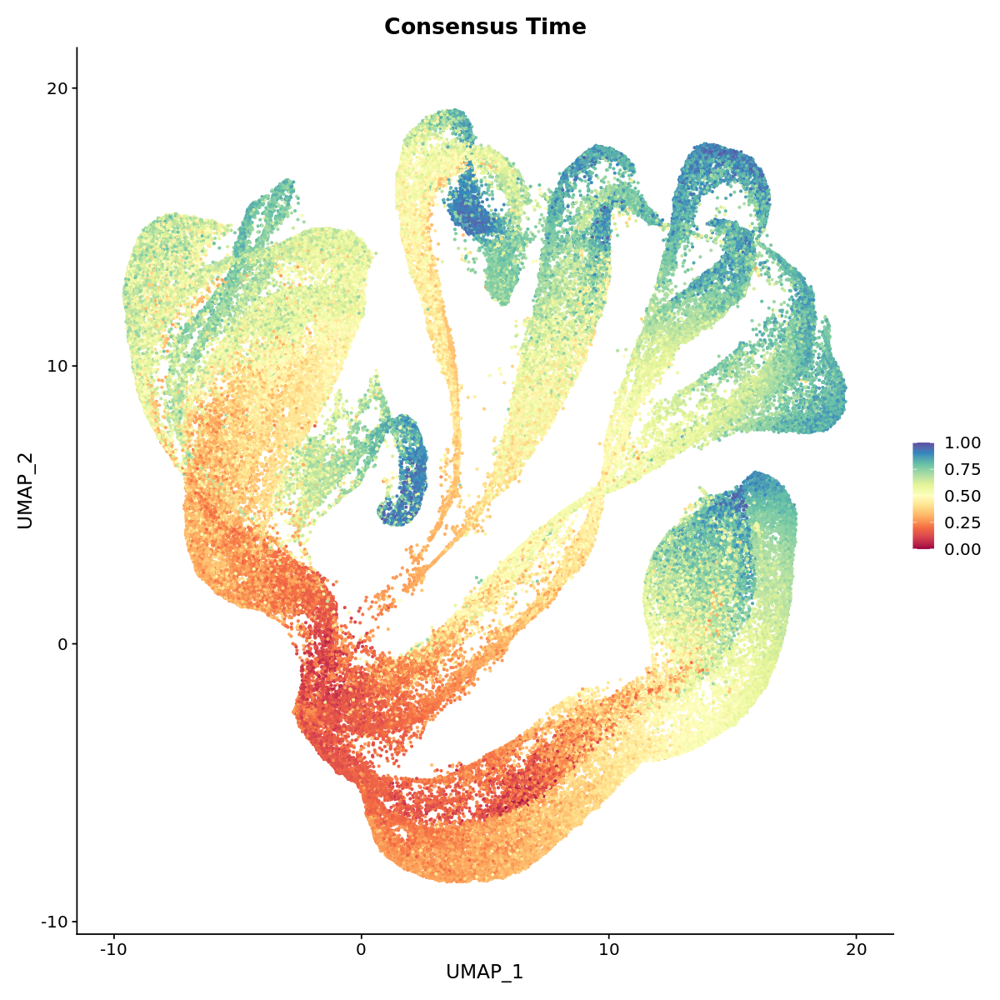

In [55]:
# Plot consensus time
options(repr.plot.width=10, repr.plot.height=10)
FeaturePlot(rc.integrated, features = "consensus.time", pt.size=0.5)+ scale_colour_gradientn(colours = brewer.pal(11,"Spectral"))+ggtitle("Consensus Time")

In [79]:
# Divide cells into ten groups of even size based on consensus time
d <- round(ncol(rc.integrated)/10);
d
names(consensus.time) <- seq(1,ncol(rc.integrated),1)
consensus.time.group <- rep("Unknown",ncol(rc.integrated))
consensus.time.group[as.numeric(names(sort(consensus.time)[1:d]))] = "T0"
consensus.time.group[as.numeric(names(sort(consensus.time)[(d+1):(2*d)]))] = "T1"
consensus.time.group[as.numeric(names(sort(consensus.time)[(2*d+1):(3*d)]))] = "T2"
consensus.time.group[as.numeric(names(sort(consensus.time)[(3*d+1):(4*d)]))] = "T3"
consensus.time.group[as.numeric(names(sort(consensus.time)[(4*d+1):(5*d)]))] = "T4"
consensus.time.group[as.numeric(names(sort(consensus.time)[(5*d+1):(6*d)]))] = "T5"
consensus.time.group[as.numeric(names(sort(consensus.time)[(6*d+1):(7*d)]))] = "T6"
consensus.time.group[as.numeric(names(sort(consensus.time)[(7*d+1):(8*d)]))] = "T7"
consensus.time.group[as.numeric(names(sort(consensus.time)[(8*d+1):(9*d)]))] = "T8"
consensus.time.group[as.numeric(names(sort(consensus.time)[(9*d+1):ncol(rc.integrated)]))] = "T9"

[1] 11043

In [86]:
table(consensus.time.group)

consensus.time.group
   T0    T1    T2    T3    T4    T5    T6    T7    T8    T9 
11043 11043 11043 11043 11043 11043 11043 11043 11043 11040 

In [87]:
# Store consensus time group
rc.integrated$consensus.time.group <- consensus.time.group

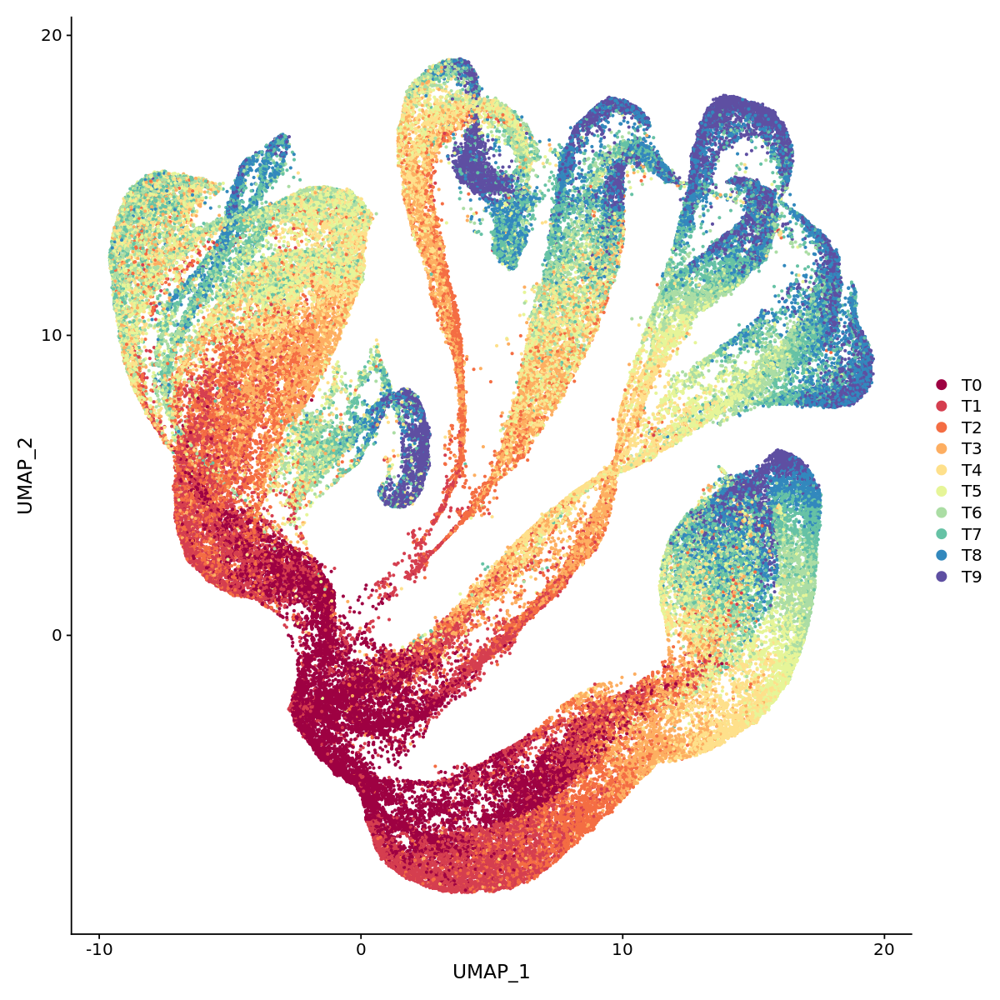

In [89]:
# Plot consensus time group
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(rc.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

In [90]:
saveRDS(rc.integrated,'./Root_Atlas.rds')

## 6. Transfer consensus time group to extracted tissue

In [11]:
end.cor.integrated$consensus.time.group <- rc.integrated$consensus.time.group[end.cor.traj.idx];
epi.integrated$consensus.time.group <- rc.integrated$consensus.time.group[epi.traj.idx];
col.integrated$consensus.time.group <- rc.integrated$consensus.time.group[col.traj.idx];
stl.integrated$consensus.time.group <- rc.integrated$consensus.time.group[stl.traj.idx];

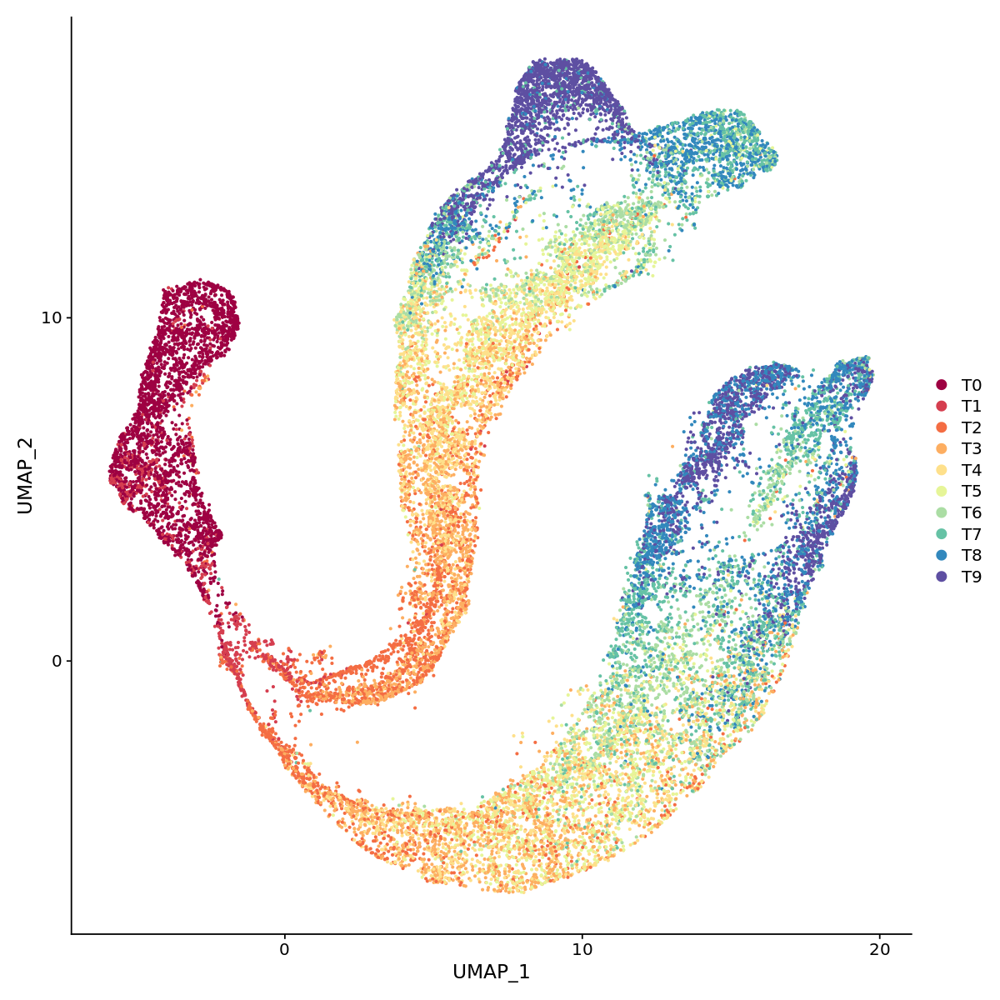

In [12]:
# Plot consensus time group for ground tissue
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(end.cor.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

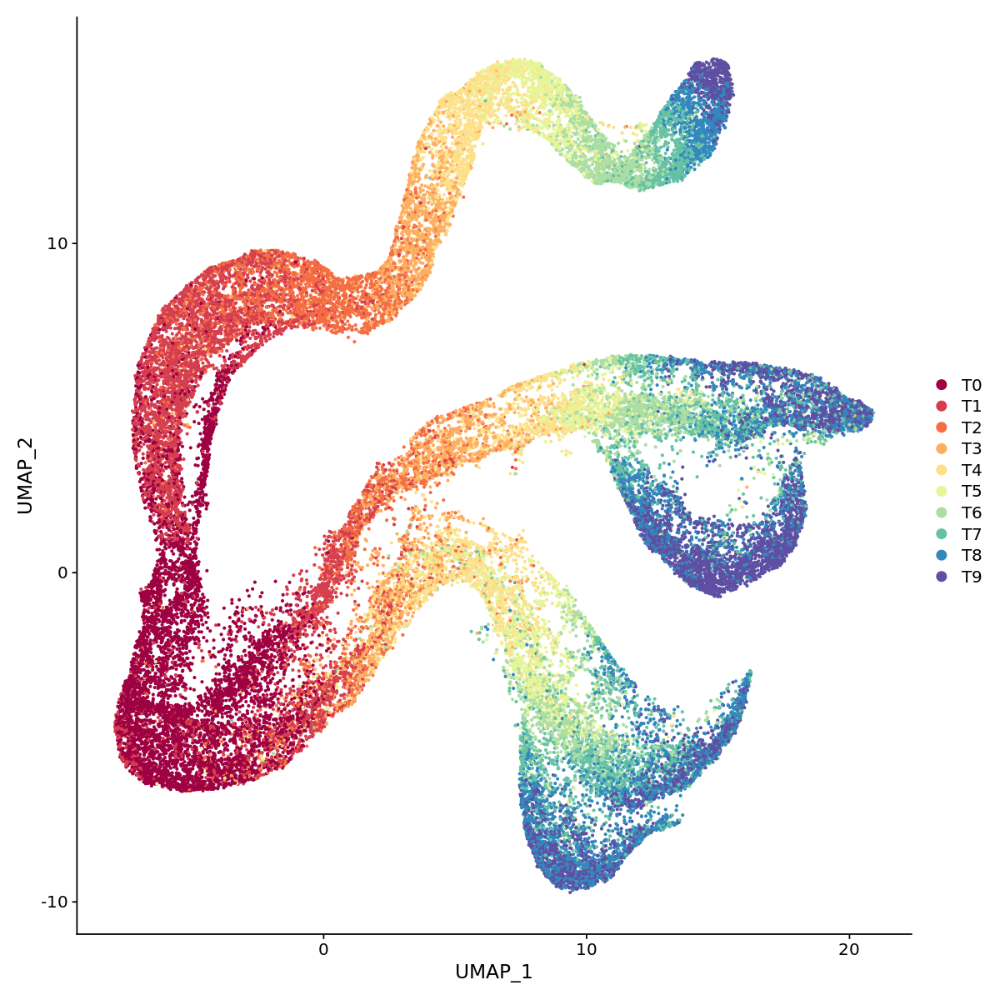

In [13]:
# Plot consensus time group for epidermis and LRC
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(epi.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

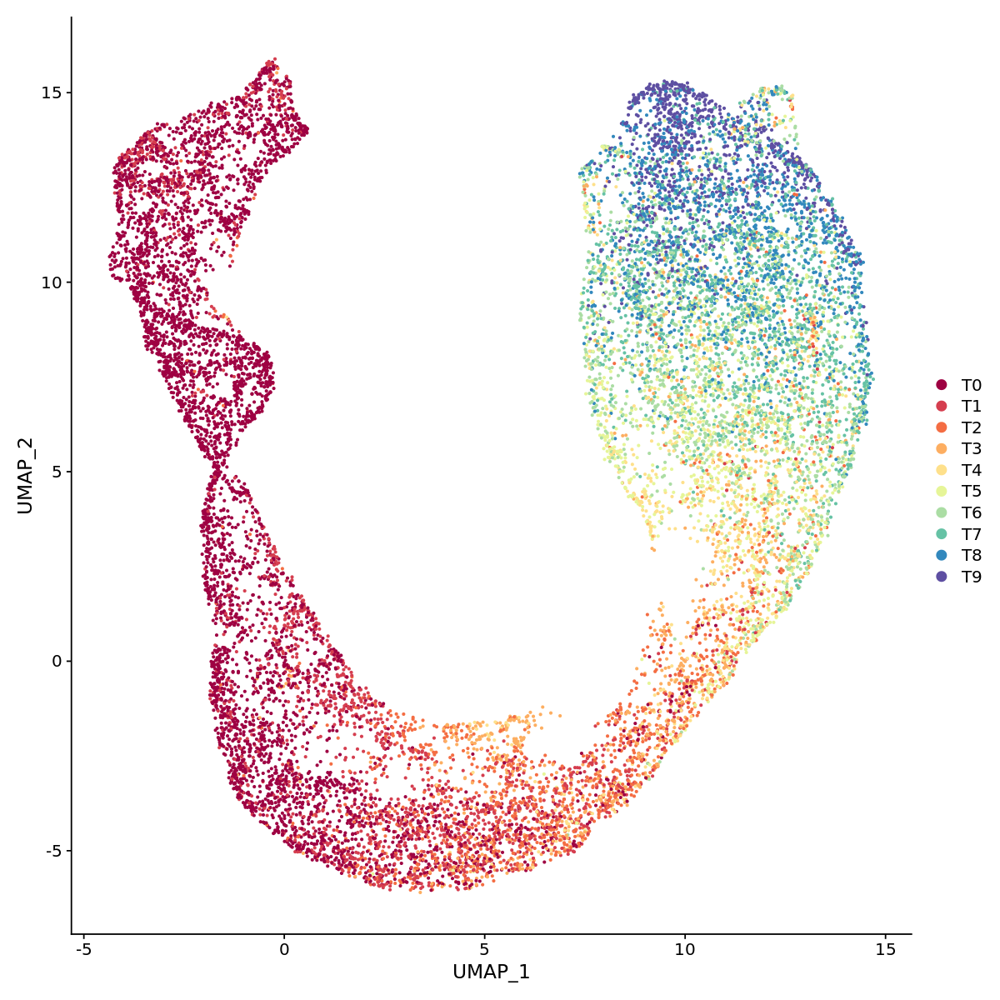

In [14]:
# Plot consensus time group for columella
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(col.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

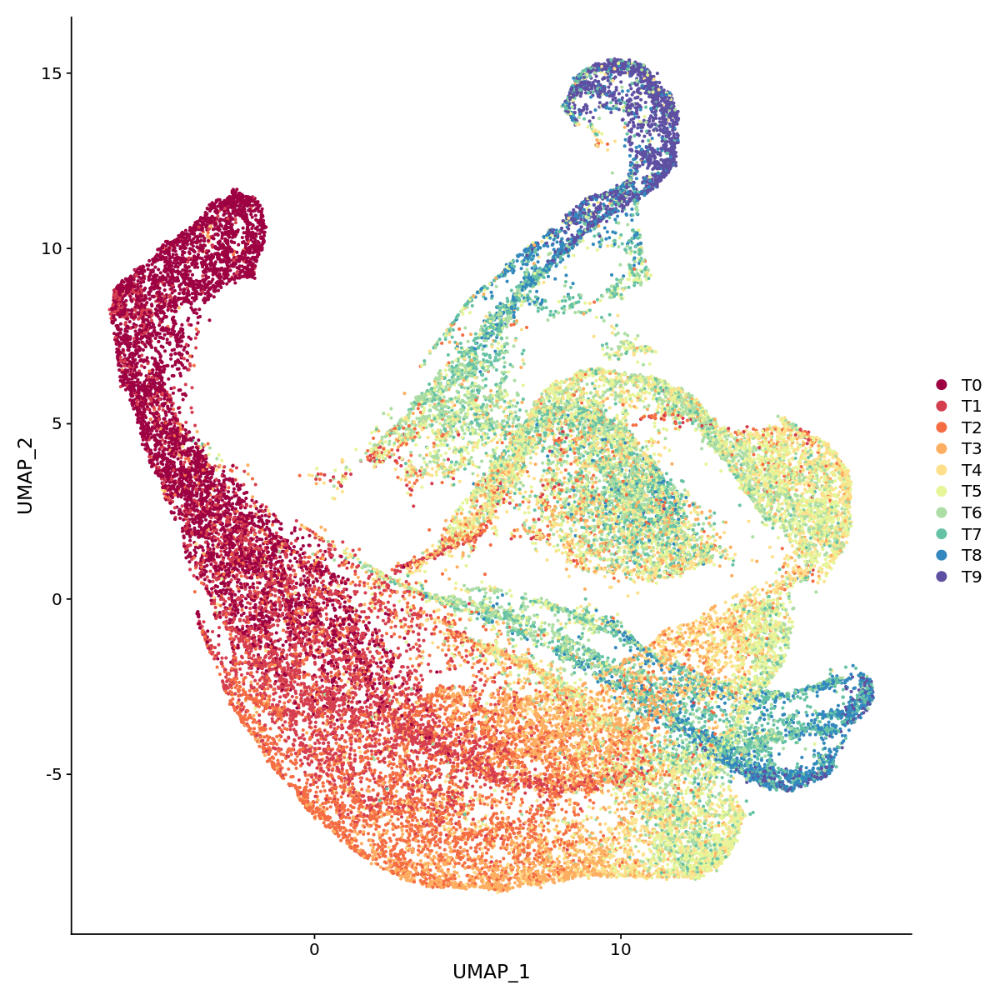

In [15]:
# Plot consensus time group for stele
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(stl.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

In [16]:
saveRDS(end.cor.integrated, './supp_data/Ground_Tissue_Atlas.rds')
saveRDS(epi.integrated, './supp_data/Epidermis_LRC_Atlas.rds')
saveRDS(col.integrated, './supp_data/Columella_Atlas.rds')
saveRDS(stl.integrated, './supp_data/Stele_Atlas.rds')